In [1]:
import xarray as xr
import matplotlib.pyplot as plt
# from cmocean import cm 
import numpy as np
import pandas as pd
from matplotlib.patches import Rectangle

### Grids

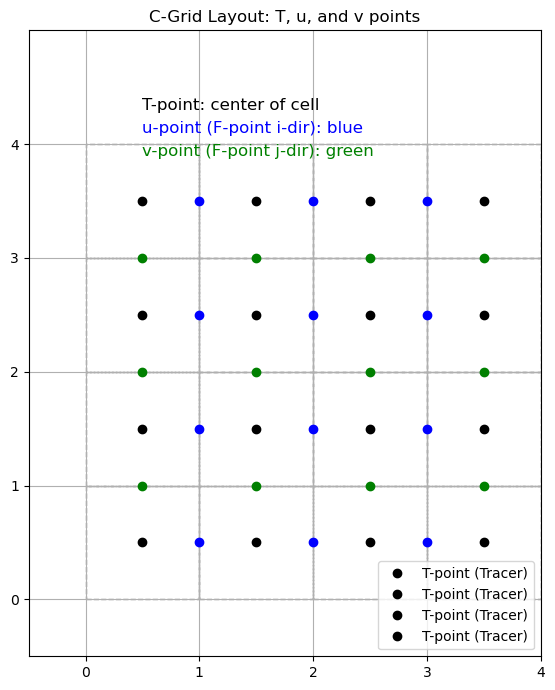

In [164]:
# Create a simple grid
nx, ny = 4, 4
x = np.arange(nx)
y = np.arange(ny)
X, Y = np.meshgrid(x, y)

fig, ax = plt.subplots(figsize=(7, 7))

# Plot T-points (cell centers)
ax.plot(X + 0.5, Y + 0.5, 'ko', label='T-point (Tracer)')

# Plot u-points (F-points in i-direction)
for j in range(ny):
    for i in range(nx - 1):
        ax.plot(i + 1, j + 0.5, 'bo')  # u-point at i+1/2, j

# Plot v-points (F-points in j-direction)
for j in range(ny - 1):
    for i in range(nx):
        ax.plot(i + 0.5, j + 1, 'go')  # v-point at i, j+1/2

# Draw grid cells
for i in range(nx):
    for j in range(ny):
        rect = plt.Rectangle((i, j), 1, 1, fill=False, linestyle='--', edgecolor='gray')
        ax.add_patch(rect)

# Labels
ax.text(0.5, ny + 0.3, 'T-point: center of cell', fontsize=12, color='k')
ax.text(0.5, ny + 0.1, 'u-point (F-point i-dir): blue', fontsize=12, color='b')
ax.text(0.5, ny - 0.1, 'v-point (F-point j-dir): green', fontsize=12, color='g')

ax.set_xlim(-0.5, nx)
ax.set_ylim(-0.5, ny + 1)
ax.set_aspect('equal')
ax.set_xticks(range(nx + 1))
ax.set_yticks(range(ny + 1))
ax.grid(True)
ax.set_title('C-Grid Layout: T, u, and v points')

plt.legend(loc='lower right')
plt.tight_layout()
plt.show()


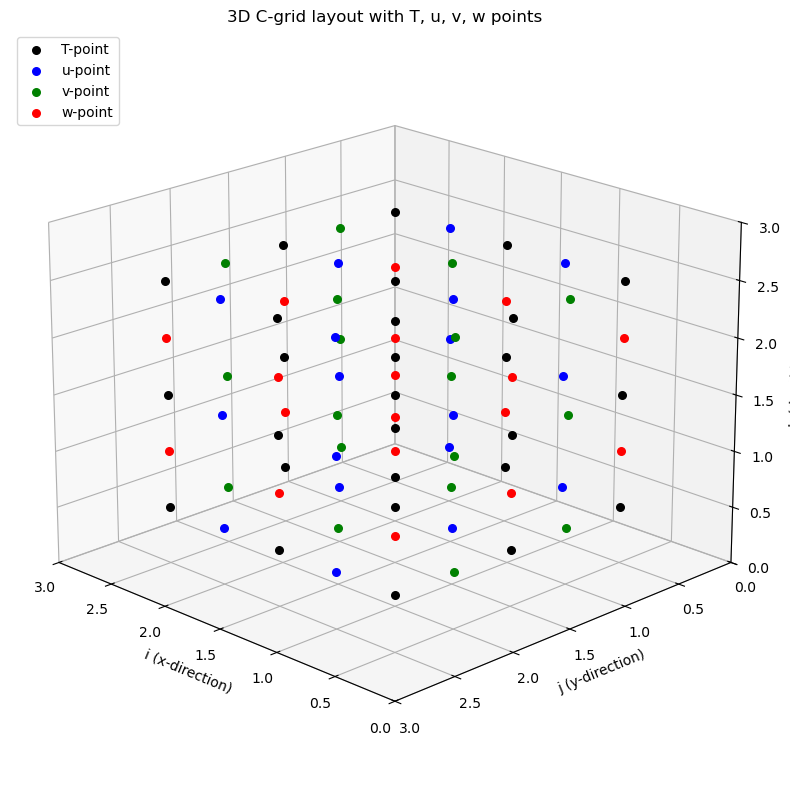

In [165]:
# Grid dimensions
nx, ny, nz = 3, 3, 3

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot T-points (cell centers)
for k in range(nz):
    for j in range(ny):
        for i in range(nx):
            ax.scatter(i + 0.5, j + 0.5, k + 0.5, color='k', label='T-point' if (i, j, k) == (0, 0, 0) else "", s=30)

# Plot U-points (faces in i-dir)
for k in range(nz):
    for j in range(ny):
        for i in range(nx - 1):
            ax.scatter(i + 1, j + 0.5, k + 0.5, color='b', label='u-point' if (i, j, k) == (0, 0, 0) else "", s=30)

# Plot V-points (faces in j-dir)
for k in range(nz):
    for j in range(ny - 1):
        for i in range(nx):
            ax.scatter(i + 0.5, j + 1, k + 0.5, color='g', label='v-point' if (i, j, k) == (0, 0, 0) else "", s=30)

# Plot W-points (faces in k-dir, vertical)
for k in range(nz - 1):
    for j in range(ny):
        for i in range(nx):
            ax.scatter(i + 0.5, j + 0.5, k + 1, color='r', label='w-point' if (i, j, k) == (0, 0, 0) else "", s=30)

# Axis settings
ax.set_xlabel("i (x-direction)")
ax.set_ylabel("j (y-direction)")
ax.set_zlabel("k (depth)")
ax.set_xlim(0, nx)
ax.set_ylim(0, ny)
ax.set_zlim(0, nz)
ax.view_init(elev=20, azim=135)
ax.set_title("3D C-grid layout with T, u, v, w points")

# Unique legend
handles, labels = ax.get_legend_handles_labels()
unique = dict(zip(labels, handles))
ax.legend(unique.values(), unique.keys(), loc='upper left')

plt.tight_layout()
plt.show()


## Masks calculation

In [4]:
ds = xr.open_dataset(r'../data/amazon2.nc')
ds

<xarray.Dataset> Size: 141MB
Dimensions:    (time: 10, depth: 50, latitude: 177, longitude: 199)
Coordinates:
  * time       (time) datetime64[ns] 80B 2021-06-01 2021-06-02 ... 2021-06-10
  * depth      (depth) float32 200B 0.494 1.541 2.646 ... 5.275e+03 5.728e+03
  * latitude   (latitude) float32 708B -3.667 -3.583 -3.5 ... 10.83 10.92 11.0
  * longitude  (longitude) float32 796B -57.75 -57.67 -57.58 ... -41.33 -41.25
Data variables:
    uo         (time, depth, latitude, longitude) float32 70MB ...
    vo         (time, depth, latitude, longitude) float32 70MB ...
Attributes:
    Conventions:       CF-1.11
    title:             daily mean fields from Global Ocean Physics Analysis a...
    institution:       MERCATOR OCEAN
    source:            MERCATOR GLORYS12V1
    history:           2023/06/01 16:20:05 MERCATOR OCEAN Netcdf creation
    references:        http://www.mercator-ocean.fr
    comment:           CMEMS product
    subset:source:     ARCO data downloaded from the Marine Data Store using ...
    subset:productId:  GLOBAL_MULTIYEAR_PHY_001_030
    subset:datasetId:  cmems_mod_glo_phy_my_0.083deg_P1D-m_202311
    subset:date:       2025-06-02T10:13:07.838Z

In [5]:
_lat = ds.latitude
_lon = ds.longitude
_zt = ds.depth

ds = ds.rename({"depth": "k", "latitude":"j", "longitude":"i"})
ds = ds.assign_coords(
    k=np.arange(ds.sizes["k"]),
    j=np.arange(ds.sizes["j"]),
    i=np.arange(ds.sizes["i"]),
    depth_t=("k", _zt.data),
    latitude_f = ("j", _lat.data),
    longitude_f = ("i", _lon.data),
)

ds = ds.rename({"uo":"uf", "vo":"vf"})
ds

<xarray.Dataset> Size: 141MB
Dimensions:      (time: 10, k: 50, j: 177, i: 199)
Coordinates:
  * time         (time) datetime64[ns] 80B 2021-06-01 2021-06-02 ... 2021-06-10
  * k            (k) int64 400B 0 1 2 3 4 5 6 7 8 ... 41 42 43 44 45 46 47 48 49
  * j            (j) int64 1kB 0 1 2 3 4 5 6 7 ... 170 171 172 173 174 175 176
  * i            (i) int64 2kB 0 1 2 3 4 5 6 7 ... 192 193 194 195 196 197 198
    depth_t      (k) float32 200B 0.494 1.541 2.646 ... 5.275e+03 5.728e+03
    latitude_f   (j) float32 708B -3.667 -3.583 -3.5 -3.417 ... 10.83 10.92 11.0
    longitude_f  (i) float32 796B -57.75 -57.67 -57.58 ... -41.42 -41.33 -41.25
Data variables:
    uf           (time, k, j, i) float32 70MB ...
    vf           (time, k, j, i) float32 70MB ...
Attributes:
    Conventions:       CF-1.11
    title:             daily mean fields from Global Ocean Physics Analysis a...
    institution:       MERCATOR OCEAN
    source:            MERCATOR GLORYS12V1
    history:           2023/06/01 16:20:05 MERCATOR OCEAN Netcdf creation
    references:        http://www.mercator-ocean.fr
    comment:           CMEMS product
    subset:source:     ARCO data downloaded from the Marine Data Store using ...
    subset:productId:  GLOBAL_MULTIYEAR_PHY_001_030
    subset:datasetId:  cmems_mod_glo_phy_my_0.083deg_P1D-m_202311
    subset:date:       2025-06-02T10:13:07.838Z

### Calculate F and T mask

In [6]:
ds = ds.assign(fmask = ds.uf.isel(time=0,drop=True).notnull())

In [7]:
ds = ds.assign(
    tmask=(
        ds.fmask.shift(i=0,j=0)
        | ds.fmask.shift(i=-1,j=-1).fillna(False)
        | ds.fmask.shift(i=0, j=-1).fillna(False)
        | ds.fmask.shift(i=-1,j=-1).fillna(False)
    ).astype(bool)
)
ds

<xarray.Dataset> Size: 144MB
Dimensions:      (time: 10, k: 50, j: 177, i: 199)
Coordinates:
  * time         (time) datetime64[ns] 80B 2021-06-01 2021-06-02 ... 2021-06-10
  * k            (k) int64 400B 0 1 2 3 4 5 6 7 8 ... 41 42 43 44 45 46 47 48 49
  * j            (j) int64 1kB 0 1 2 3 4 5 6 7 ... 170 171 172 173 174 175 176
  * i            (i) int64 2kB 0 1 2 3 4 5 6 7 ... 192 193 194 195 196 197 198
    depth_t      (k) float32 200B 0.494 1.541 2.646 ... 5.275e+03 5.728e+03
    latitude_f   (j) float32 708B -3.667 -3.583 -3.5 -3.417 ... 10.83 10.92 11.0
    longitude_f  (i) float32 796B -57.75 -57.67 -57.58 ... -41.42 -41.33 -41.25
Data variables:
    uf           (time, k, j, i) float32 70MB ...
    vf           (time, k, j, i) float32 70MB ...
    fmask        (k, j, i) bool 2MB False False False ... False False False
    tmask        (k, j, i) bool 2MB False False False ... False False False
Attributes:
    Conventions:       CF-1.11
    title:             daily mean fields from Global Ocean Physics Analysis a...
    institution:       MERCATOR OCEAN
    source:            MERCATOR GLORYS12V1
    history:           2023/06/01 16:20:05 MERCATOR OCEAN Netcdf creation
    references:        http://www.mercator-ocean.fr
    comment:           CMEMS product
    subset:source:     ARCO data downloaded from the Marine Data Store using ...
    subset:productId:  GLOBAL_MULTIYEAR_PHY_001_030
    subset:datasetId:  cmems_mod_glo_phy_my_0.083deg_P1D-m_202311
    subset:date:       2025-06-02T10:13:07.838Z

### Calculate U and V faces

In [8]:
ds = ds.assign(
    u=(ds.uf.fillna(0) + ds.uf.shift(j=-1).fillna(0)) /2,
    v=(ds.vf.fillna(0) + ds.vf.shift(i=-1).fillna(0)) /2,
)
ds
## U and V faces are already in the middle 

<xarray.Dataset> Size: 285MB
Dimensions:      (time: 10, k: 50, j: 177, i: 199)
Coordinates:
  * time         (time) datetime64[ns] 80B 2021-06-01 2021-06-02 ... 2021-06-10
  * k            (k) int64 400B 0 1 2 3 4 5 6 7 8 ... 41 42 43 44 45 46 47 48 49
  * j            (j) int64 1kB 0 1 2 3 4 5 6 7 ... 170 171 172 173 174 175 176
  * i            (i) int64 2kB 0 1 2 3 4 5 6 7 ... 192 193 194 195 196 197 198
    depth_t      (k) float32 200B 0.494 1.541 2.646 ... 5.275e+03 5.728e+03
    latitude_f   (j) float32 708B -3.667 -3.583 -3.5 -3.417 ... 10.83 10.92 11.0
    longitude_f  (i) float32 796B -57.75 -57.67 -57.58 ... -41.42 -41.33 -41.25
Data variables:
    uf           (time, k, j, i) float32 70MB ...
    vf           (time, k, j, i) float32 70MB ...
    fmask        (k, j, i) bool 2MB False False False ... False False False
    tmask        (k, j, i) bool 2MB False False False ... False False False
    u            (time, k, j, i) float32 70MB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0
    v            (time, k, j, i) float32 70MB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0
Attributes:
    Conventions:       CF-1.11
    title:             daily mean fields from Global Ocean Physics Analysis a...
    institution:       MERCATOR OCEAN
    source:            MERCATOR GLORYS12V1
    history:           2023/06/01 16:20:05 MERCATOR OCEAN Netcdf creation
    references:        http://www.mercator-ocean.fr
    comment:           CMEMS product
    subset:source:     ARCO data downloaded from the Marine Data Store using ...
    subset:productId:  GLOBAL_MULTIYEAR_PHY_001_030
    subset:datasetId:  cmems_mod_glo_phy_my_0.083deg_P1D-m_202311
    subset:date:       2025-06-02T10:13:07.838Z

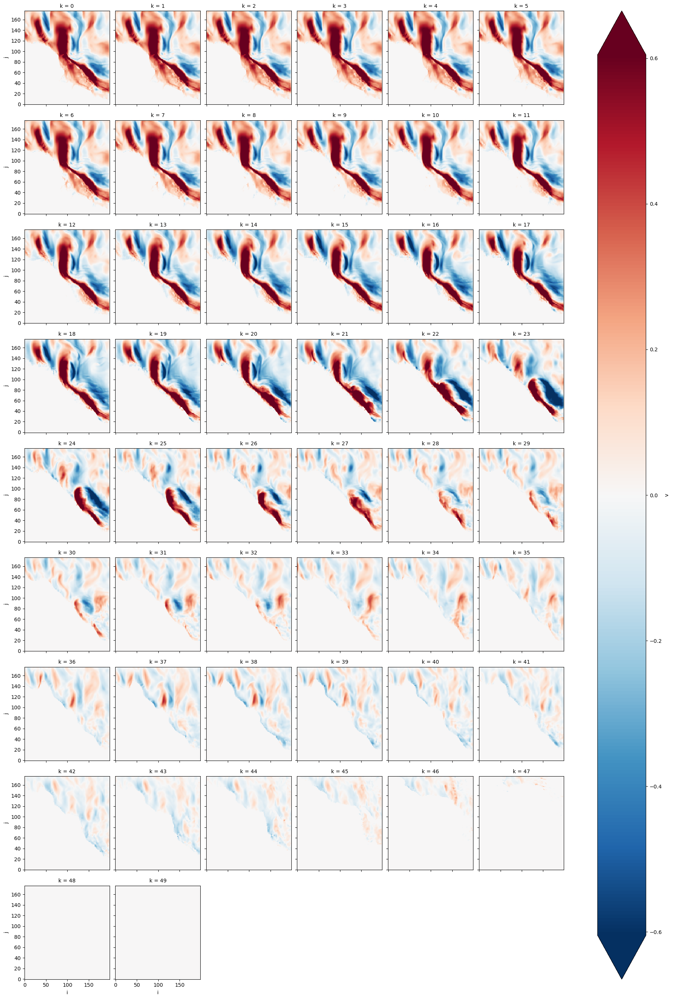

In [9]:
ds.v.isel(time=0).plot(x='i',y='j',col='k',col_wrap=6, robust=True)

### Create Zt

In [11]:
zt = ds.depth_t.data
zw = [zt[0]*2]


for k in range(1,50):
    zw.append((zt[k] - zw[k-1])*2 + zw[k-1])
print(zw)

[np.float32(0.98805), np.float32(2.0947), np.float32(3.1966379), np.float32(4.4423523), np.float32(5.714096), np.float32(7.1671324), np.float32(8.691988), np.float32(10.454006), np.float32(12.355993), np.float32(14.578287), np.float32(17.041853), np.float32(19.949266), np.float32(23.248373), np.float32(27.174448), np.float32(31.715014), np.float32(37.15329), np.float32(43.534813), np.float32(51.21257), np.float32(60.31601), np.float32(71.29852), np.float32(84.40918), np.float32(100.242966), np.float32(119.21564), np.float32(142.11636), np.float32(169.58502), np.float32(202.66617), np.float32(242.28424), np.float32(289.7964), np.float32(346.45844), np.float32(413.9676), np.float32(493.90784), np.float32(588.27), np.float32(698.8635), np.float32(827.80273), np.float32(976.87585), np.float32(1148.004), np.float32(1342.578), np.float32(1561.924), np.float32(1806.6442), np.float32(2077.1416), np.float32(2373.0142), np.float32(2693.6577), np.float32(3037.748), np.float32(3403.892), np.float3

In [13]:
# ds.assign_coords(depth_w = ("k",zw[0:50]))
ds = ds.assign_coords(depth_w = ("k",zw))
ds

<xarray.Dataset> Size: 285MB
Dimensions:      (time: 10, k: 50, j: 177, i: 199)
Coordinates:
  * time         (time) datetime64[ns] 80B 2021-06-01 2021-06-02 ... 2021-06-10
  * k            (k) int64 400B 0 1 2 3 4 5 6 7 8 ... 41 42 43 44 45 46 47 48 49
  * j            (j) int64 1kB 0 1 2 3 4 5 6 7 ... 170 171 172 173 174 175 176
  * i            (i) int64 2kB 0 1 2 3 4 5 6 7 ... 192 193 194 195 196 197 198
    depth_t      (k) float32 200B 0.494 1.541 2.646 ... 5.275e+03 5.728e+03
    latitude_f   (j) float32 708B -3.667 -3.583 -3.5 -3.417 ... 10.83 10.92 11.0
    longitude_f  (i) float32 796B -57.75 -57.67 -57.58 ... -41.42 -41.33 -41.25
    depth_w      (k) float32 200B 0.988 2.095 3.197 ... 5.499e+03 5.957e+03
Data variables:
    uf           (time, k, j, i) float32 70MB ...
    vf           (time, k, j, i) float32 70MB ...
    fmask        (k, j, i) bool 2MB False False False ... False False False
    tmask        (k, j, i) bool 2MB False False False ... False False False
    u            (time, k, j, i) float32 70MB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0
    v            (time, k, j, i) float32 70MB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0
Attributes:
    Conventions:       CF-1.11
    title:             daily mean fields from Global Ocean Physics Analysis a...
    institution:       MERCATOR OCEAN
    source:            MERCATOR GLORYS12V1
    history:           2023/06/01 16:20:05 MERCATOR OCEAN Netcdf creation
    references:        http://www.mercator-ocean.fr
    comment:           CMEMS product
    subset:source:     ARCO data downloaded from the Marine Data Store using ...
    subset:productId:  GLOBAL_MULTIYEAR_PHY_001_030
    subset:datasetId:  cmems_mod_glo_phy_my_0.083deg_P1D-m_202311
    subset:date:       2025-06-02T10:13:07.838Z

In [31]:
ds = ds.assign_coords(
    longitude_u = ds.longitude_f,
    latitude_v =  ds.latitude_f,
    
    latitude_u = ds.latitude_f + 1/12/2, 
    longitude_v = ds.longitude_f + 1/12/2,
    
    latitude_t = ds.latitude_f + 1/12/2, 
    longitude_t = ds.longitude_f + 1/12/2,
)
ds

<xarray.Dataset> Size: 285MB
Dimensions:      (time: 10, k: 50, j: 177, i: 199)
Coordinates: (12/17)
  * time         (time) datetime64[ns] 80B 2021-06-01 2021-06-02 ... 2021-06-10
  * k            (k) int64 400B 0 1 2 3 4 5 6 7 8 ... 41 42 43 44 45 46 47 48 49
  * j            (j) int64 1kB 0 1 2 3 4 5 6 7 ... 170 171 172 173 174 175 176
  * i            (i) int64 2kB 0 1 2 3 4 5 6 7 ... 192 193 194 195 196 197 198
    depth_t      (k) float32 200B 0.494 1.541 2.646 ... 5.275e+03 5.728e+03
    latitude_f   (j) float32 708B -3.667 -3.583 -3.5 -3.417 ... 10.83 10.92 11.0
    ...           ...
    longitude_v  (i) float32 796B -57.71 -57.62 -57.54 ... -41.37 -41.29 -41.21
    latitude_t   (j) float32 708B -3.625 -3.542 -3.458 ... 10.88 10.96 11.04
    longitude_t  (i) float32 796B -57.71 -57.62 -57.54 ... -41.37 -41.29 -41.21
    dz_t         (k) float32 200B 0.988 1.107 1.102 1.246 ... 435.3 447.7 458.6
    dx_t         (j) float64 1kB 9.248e+03 9.249e+03 ... 9.097e+03 9.095e+03
    dy_t         float64 8B 9.266e+03
Data variables:
    uf           (time, k, j, i) float32 70MB ...
    vf           (time, k, j, i) float32 70MB ...
    fmask        (k, j, i) bool 2MB False False False ... False False False
    tmask        (k, j, i) bool 2MB False False False ... False False False
    u            (time, k, j, i) float32 70MB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0
    v            (time, k, j, i) float32 70MB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0
Attributes:
    Conventions:       CF-1.11
    title:             daily mean fields from Global Ocean Physics Analysis a...
    institution:       MERCATOR OCEAN
    source:            MERCATOR GLORYS12V1
    history:           2023/06/01 16:20:05 MERCATOR OCEAN Netcdf creation
    references:        http://www.mercator-ocean.fr
    comment:           CMEMS product
    subset:source:     ARCO data downloaded from the Marine Data Store using ...
    subset:productId:  GLOBAL_MULTIYEAR_PHY_001_030
    subset:datasetId:  cmems_mod_glo_phy_my_0.083deg_P1D-m_202311
    subset:date:       2025-06-02T10:13:07.838Z

In [48]:
R = 6371e3 
ds = ds.assign_coords(
    dz_t = ds.depth_w - ds.depth_w.shift(k=1).fillna(0), 
    dx_t = np.deg2rad(1/12) * R * np.cos(np.deg2rad(ds.latitude_t)),
    dy_t = np.deg2rad(1/12) * R ,
    
)

In [50]:
dy = np.deg2rad(ds.latitude_t.diff('j')) * R
dy = dy.pad(j=(0,1), mode='edge') # match dims
dy = dy.assign_coords(j=ds.j)  

dx = np.deg2rad(ds.longitude_t.diff('i')) * R * np.cos(np.deg2rad(ds.latitude_t))
dx = dx.pad(i=(0,0), mode='edge')
# dx = dx.assign_coords(i=ds.i)  

ds = ds.assign_coords(
    dz_t = ds.depth_w - ds.depth_w.shift(k=1).fillna(0), 
    dx_t2 = dx,
    dy_t2 = dy,
    
)
ds

<xarray.Dataset> Size: 285MB
Dimensions:      (time: 10, k: 50, j: 177, i: 199)
Coordinates: (12/19)
  * time         (time) datetime64[ns] 80B 2021-06-01 2021-06-02 ... 2021-06-10
  * k            (k) int64 400B 0 1 2 3 4 5 6 7 8 ... 41 42 43 44 45 46 47 48 49
  * j            (j) int64 1kB 0 1 2 3 4 5 6 7 ... 170 171 172 173 174 175 176
  * i            (i) int64 2kB 0 1 2 3 4 5 6 7 ... 192 193 194 195 196 197 198
    depth_t      (k) float32 200B 0.494 1.541 2.646 ... 5.275e+03 5.728e+03
    latitude_f   (j) float32 708B -3.667 -3.583 -3.5 -3.417 ... 10.83 10.92 11.0
    ...           ...
    longitude_t  (i) float32 796B nan -57.62 -57.54 ... -41.37 -41.29 -41.21
    dz_t         (k) float32 200B 0.988 1.107 1.102 1.246 ... 435.3 447.7 458.6
    dx_t         (j) float64 1kB 9.248e+03 9.249e+03 ... 9.097e+03 9.095e+03
    dy_t         float64 8B 9.266e+03
    dx_t2        (i, j) float32 141kB nan nan nan ... 9.097e+03 9.095e+03
    dy_t2        (j) float32 708B 9.266e+03 9.266e+03 ... 9.266e+03 9.266e+03
Data variables:
    uf           (time, k, j, i) float32 70MB ...
    vf           (time, k, j, i) float32 70MB ...
    fmask        (k, j, i) bool 2MB False False False ... False False False
    tmask        (k, j, i) bool 2MB False False False ... False False False
    u            (time, k, j, i) float32 70MB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0
    v            (time, k, j, i) float32 70MB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0
Attributes:
    Conventions:       CF-1.11
    title:             daily mean fields from Global Ocean Physics Analysis a...
    institution:       MERCATOR OCEAN
    source:            MERCATOR GLORYS12V1
    history:           2023/06/01 16:20:05 MERCATOR OCEAN Netcdf creation
    references:        http://www.mercator-ocean.fr
    comment:           CMEMS product
    subset:source:     ARCO data downloaded from the Marine Data Store using ...
    subset:productId:  GLOBAL_MULTIYEAR_PHY_001_030
    subset:datasetId:  cmems_mod_glo_phy_my_0.083deg_P1D-m_202311
    subset:date:       2025-06-02T10:13:07.838Z

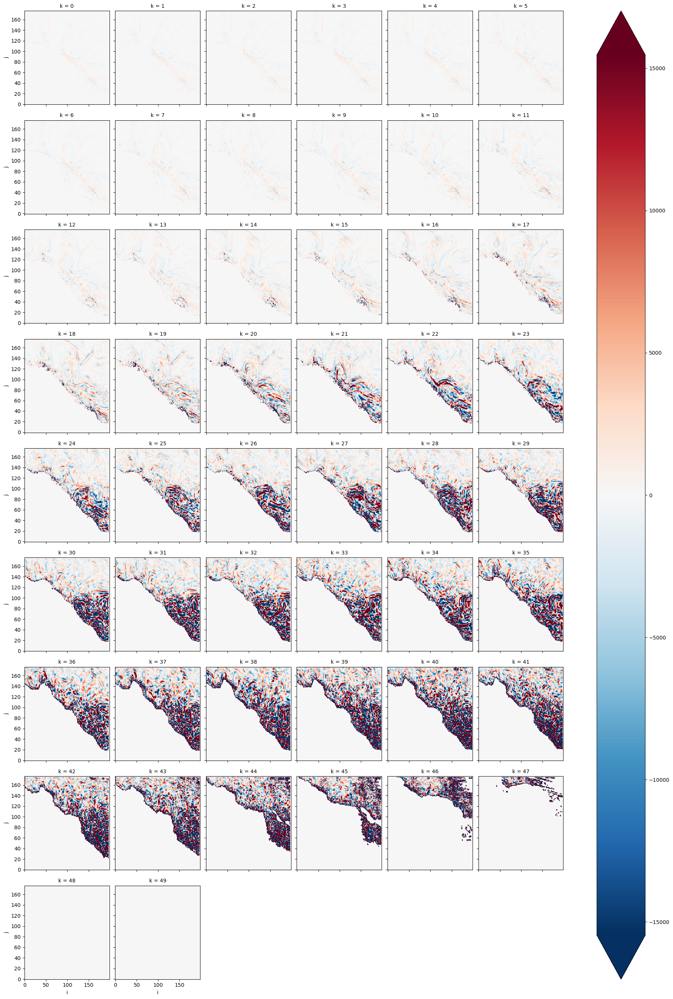

In [87]:
F_uv_vol = (
    ds.u * ds.dy_t * ds.dz_t - ds.u.shift(i=-1)* ds.dy_t * ds.dz_t 
    + ds.v * ds.dx_t * ds.dz_t - ds.v.shift(j=-1) * ds.dx_t * ds.dz_t
)
F_uv_vol.isel(time=0).plot(x='i',y='j',col='k',col_wrap=6, robust=True)

In [52]:
dw_by_dz = F_uv_vol/ds.dx_t/ds.dy_t/ds.dz_t
dw_by_dz

<xarray.DataArray (time: 10, k: 50, j: 177, i: 199)> Size: 141MB
array([[[[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,             nan],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,             nan],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,             nan],
         ...,
         [ 1.65398707e-06,  1.95763842e-06,  1.76725213e-06, ...,
           4.67118965e-07,  7.62327093e-07,             nan],
         [ 4.64763113e-07,  9.62454647e-07,  1.36195988e-06, ...,
           3.41580837e-08,  5.30020477e-07,             nan],
         [            nan,             nan,             nan, ...,
                      nan,             nan,             nan]],

        [[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,             nan],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,             nan],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,             nan],
...
           0.00000000e+00,  0.00000000e+00,             nan],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,             nan],
         [            nan,             nan,             nan, ...,
                      nan,             nan,             nan]],

        [[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,             nan],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,             nan],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,             nan],
         ...,
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,             nan],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,             nan],
         [            nan,             nan,             nan, ...,
                      nan,             nan,             nan]]]],
      shape=(10, 50, 177, 199))
Coordinates: (12/19)
  * time         (time) datetime64[ns] 80B 2021-06-01 2021-06-02 ... 2021-06-10
  * k            (k) int64 400B 0 1 2 3 4 5 6 7 8 ... 41 42 43 44 45 46 47 48 49
  * j            (j) int64 1kB 0 1 2 3 4 5 6 7 ... 170 171 172 173 174 175 176
  * i            (i) int64 2kB 0 1 2 3 4 5 6 7 ... 192 193 194 195 196 197 198
    depth_t      (k) float32 200B 0.494 1.541 2.646 ... 5.275e+03 5.728e+03
    latitude_f   (j) float32 708B -3.667 -3.583 -3.5 -3.417 ... 10.83 10.92 11.0
    ...           ...
    longitude_t  (i) float32 796B nan -57.62 -57.54 ... -41.37 -41.29 -41.21
    dz_t         (k) float32 200B 0.988 1.107 1.102 1.246 ... 435.3 447.7 458.6
    dx_t         (j) float64 1kB 9.248e+03 9.249e+03 ... 9.097e+03 9.095e+03
    dy_t         float64 8B 9.266e+03
    dx_t2        (i, j) float32 141kB nan nan nan ... 9.097e+03 9.095e+03
    dy_t2        (j) float32 708B 9.266e+03 9.266e+03 ... 9.266e+03 9.266e+03

In [53]:
w = (dw_by_dz * ds.dz_t).cumsum('k').where(ds.tmask==1)
# w.plot.hist(bins=np.linspace(-1e-3,1e-3,100),size=20);

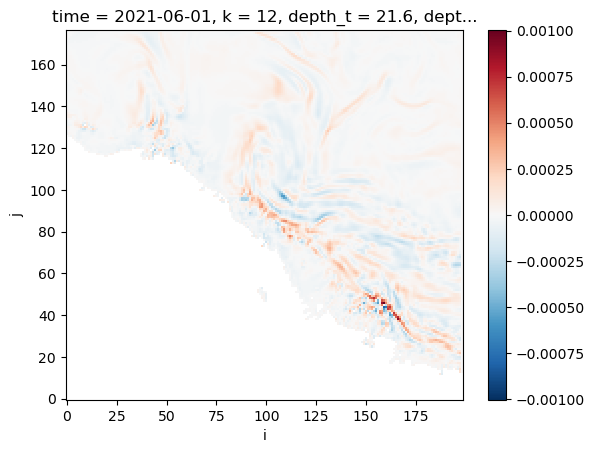

In [54]:
w.isel(k=12,time=0).plot()

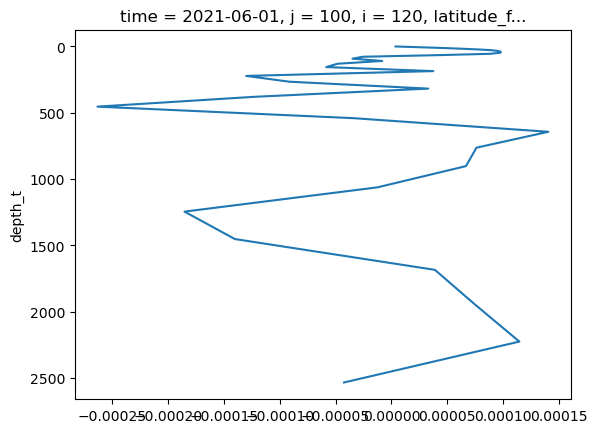

In [55]:
w.isel(i=120,j=100,time=0).plot(y='depth_t')
plt.gca().invert_yaxis()

In [56]:
w_bottom=w.isel(k=ds.tmask.sum('k')-1)
w_bottom

<xarray.DataArray (time: 10, j: 177, i: 199)> Size: 3MB
array([[[            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        [            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        [            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        ...,
        [ 1.21910997e-03, -7.36254211e-04, -4.38812079e-05, ...,
         -2.36425027e-05, -1.77177231e-03,  0.00000000e+00],
        [ 4.83072609e-04, -7.34011429e-04, -1.76869610e-04, ...,
         -5.26930240e-05,  2.57063074e-04,  0.00000000e+00],
        [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00]],

       [[            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        [            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        [            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
...
          2.89969913e-04, -1.66120074e-03,  0.00000000e+00],
        [ 5.38260570e-04, -9.73198392e-04, -3.74490212e-04, ...,
         -1.15990493e-04,  5.73340503e-04,  0.00000000e+00],
        [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00]],

       [[            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        [            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        [            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        ...,
        [ 1.18030216e-03, -1.02777718e-03, -1.64840505e-04, ...,
          3.94031464e-04, -1.71188084e-03,  0.00000000e+00],
        [ 6.68326389e-04, -1.19525266e-03, -3.77954705e-04, ...,
         -1.57594917e-05,  6.74775786e-04,  0.00000000e+00],
        [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00]]],
      shape=(10, 177, 199))
Coordinates: (12/19)
  * time         (time) datetime64[ns] 80B 2021-06-01 2021-06-02 ... 2021-06-10
    k            (j, i) int64 282kB 49 49 49 49 49 49 49 ... 44 43 44 44 44 45
  * j            (j) int64 1kB 0 1 2 3 4 5 6 7 ... 170 171 172 173 174 175 176
  * i            (i) int64 2kB 0 1 2 3 4 5 6 7 ... 192 193 194 195 196 197 198
    depth_t      (j, i) float32 141kB 5.728e+03 5.728e+03 ... 3.992e+03
    latitude_f   (j) float32 708B -3.667 -3.583 -3.5 -3.417 ... 10.83 10.92 11.0
    ...           ...
    longitude_t  (i) float32 796B nan -57.62 -57.54 ... -41.37 -41.29 -41.21
    dz_t         (j, i) float32 141kB 458.6 458.6 458.6 ... 386.3 386.3 404.6
    dx_t         (j) float64 1kB 9.248e+03 9.249e+03 ... 9.097e+03 9.095e+03
    dy_t         float64 8B 9.266e+03
    dx_t2        (i, j) float32 141kB nan nan nan ... 9.097e+03 9.095e+03
    dy_t2        (j) float32 708B 9.266e+03 9.266e+03 ... 9.266e+03 9.266e+03

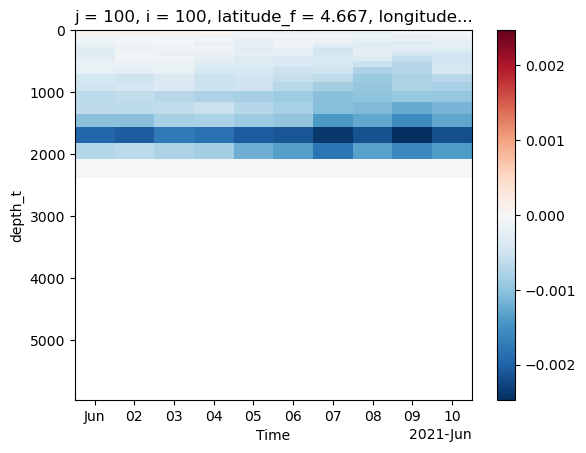

In [88]:
w_correct = w - (w_bottom / ds.dz_t.where(ds.tmask==1).sum('k') * ds.depth_w)
w_correct.isel(j=100,i=100).plot(x='time',y='depth_t')
plt.gca().invert_yaxis()

### Add Z=0 at top and bottom

In [10]:
ds

<xarray.Dataset> Size: 285MB
Dimensions:      (time: 10, k: 50, j: 177, i: 199)
Coordinates:
  * time         (time) datetime64[ns] 80B 2021-06-01 2021-06-02 ... 2021-06-10
  * k            (k) int64 400B 0 1 2 3 4 5 6 7 8 ... 41 42 43 44 45 46 47 48 49
  * j            (j) int64 1kB 0 1 2 3 4 5 6 7 ... 170 171 172 173 174 175 176
  * i            (i) int64 2kB 0 1 2 3 4 5 6 7 ... 192 193 194 195 196 197 198
    depth_t      (k) float32 200B 0.494 1.541 2.646 ... 5.275e+03 5.728e+03
    latitude_f   (j) float32 708B -3.667 -3.583 -3.5 -3.417 ... 10.83 10.92 11.0
    longitude_f  (i) float32 796B -57.75 -57.67 -57.58 ... -41.42 -41.33 -41.25
Data variables:
    uf           (time, k, j, i) float32 70MB ...
    vf           (time, k, j, i) float32 70MB ...
    fmask        (k, j, i) bool 2MB False False False ... False False False
    tmask        (k, j, i) bool 2MB False False False ... False False False
    u            (time, k, j, i) float32 70MB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0
    v            (time, k, j, i) float32 70MB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0
Attributes:
    Conventions:       CF-1.11
    title:             daily mean fields from Global Ocean Physics Analysis a...
    institution:       MERCATOR OCEAN
    source:            MERCATOR GLORYS12V1
    history:           2023/06/01 16:20:05 MERCATOR OCEAN Netcdf creation
    references:        http://www.mercator-ocean.fr
    comment:           CMEMS product
    subset:source:     ARCO data downloaded from the Marine Data Store using ...
    subset:productId:  GLOBAL_MULTIYEAR_PHY_001_030
    subset:datasetId:  cmems_mod_glo_phy_my_0.083deg_P1D-m_202311
    subset:date:       2025-06-02T10:13:07.838Z

In [12]:
# 1. Crear una capa de ceros para uf y vf
# layer_0 = xr.zeros_like(ds.uf.isel(k=0)).expand_dims(k=[-1])
# layer_0_mask = xr.zeros_like(ds.tmask.isel(k=0)).expand_dims(k=[-1])


# ds_ = xr.Dataset(
#     data_vars = {
#         'uf': (('k','time','j','i'), np.concatenate([layer_0, ds.uf,layer_0])),
#         'vf': (('k','time','j','i'), np.concatenate([layer_0, ds.vf,layer_0])),
#         'fmask': (('k','j','i'), np.concatenate([layer_0_mask, ds.fmask,layer_0_mask])),
#         'tmask': (('k','j','i'), np.concatenate([layer_0_mask, ds.fmask,layer_0_mask])),
#         'u': (('k','time','j','i'), np.concatenate([layer_0, ds.u.transpose('k','time','j','i'),layer_0])),
#         'v': (('k','time','j','i'), np.concatenate([layer_0, ds.v.transpose('k','time','j','i'),layer_0])),
#     },
#     coords = {
#         'k':np.arange(0,52),
#         'time':ds.time,
#         'j':ds.j,
#         'i':ds.i,
#     }
# )
# ds_
# # # # 2. Concatenar por la dimensión vertical 'k'
# # ds['uf'] = np.concatenate([new_layer, ds.uf])
# # # ds['vf'] = xr.concat([new_layer, ds.vf], dim='k')
# # # ds

## Integration

In [58]:
R = 6371e3  # Earth radius in meters

# Load your u, v, and coordinates (1 time step)
uf = ds.u.isel(time=0)
vf = ds.u.isel(time=0)

lat = ds.latitude_t
lon = ds.longitude_t
depth = ds.depth_t

##mid z
z_midi = (ds.depth_t.shift(k=-1) + ds.depth_t) / 2
z_midi = z_midi.isel(k=slice(0, -1)) 

# 1. Compute dx and dy in meters
dy = np.deg2rad(lat.diff('j')) * R
dy = dy.pad(latitude=(0,0), mode='edge')  # match dims

dx = np.deg2rad(lon.diff('i')) * R * np.cos(np.deg2rad(lat))
dx = dx.pad(longitude=(0,0), mode='edge')

# 2. Compute dz (layer thickness)
dz = depth.diff('k')
# dz = dz.pad(depth=(0,1), mode='edge')  # pad bottom layer

# 3. Broadcast shapes for dx, dy, dz
dx_3d = dx.broadcast_like(uf)
dy_3d = dy.broadcast_like(vf)
dy_3d = dy_3d.assign_coords(longitude_f=vf.longitude_f)
dz_3d = dz.broadcast_like(uf)

# 4. Compute fluxes
F_u = (uf * dy_3d * dz_3d).where(ds.fmask == 1).fillna(0)  # zonal volume flux
F_v = (vf * dx_3d * dz_3d).where(ds.fmask == 1).fillna(0)  # meridional volume flux

# 5. Compute divergence of volume fluxes
dF_u_dx = (F_u.shift(i=-1) - F_u) / dx_3d
dF_v_dy = (F_v.shift(j=-1) - F_v) / dy_3d

div_flux = (dF_u_dx + dF_v_dy).fillna(0)

# dz_3d = dz.broadcast_like(div_flux.isel(depth=slice(0, -1)))

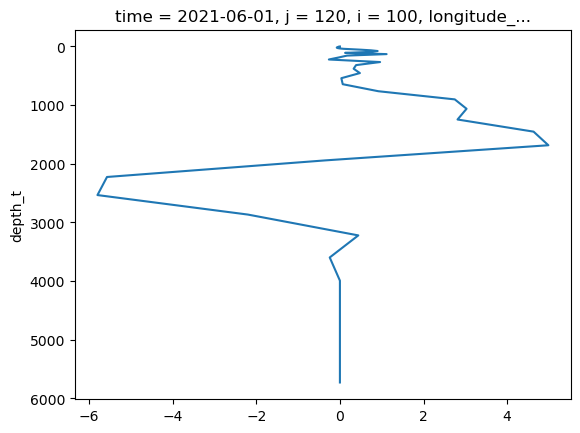

In [59]:
div_flux.isel(i=100,j=120).plot(y='depth_t')
plt.gca().invert_yaxis()

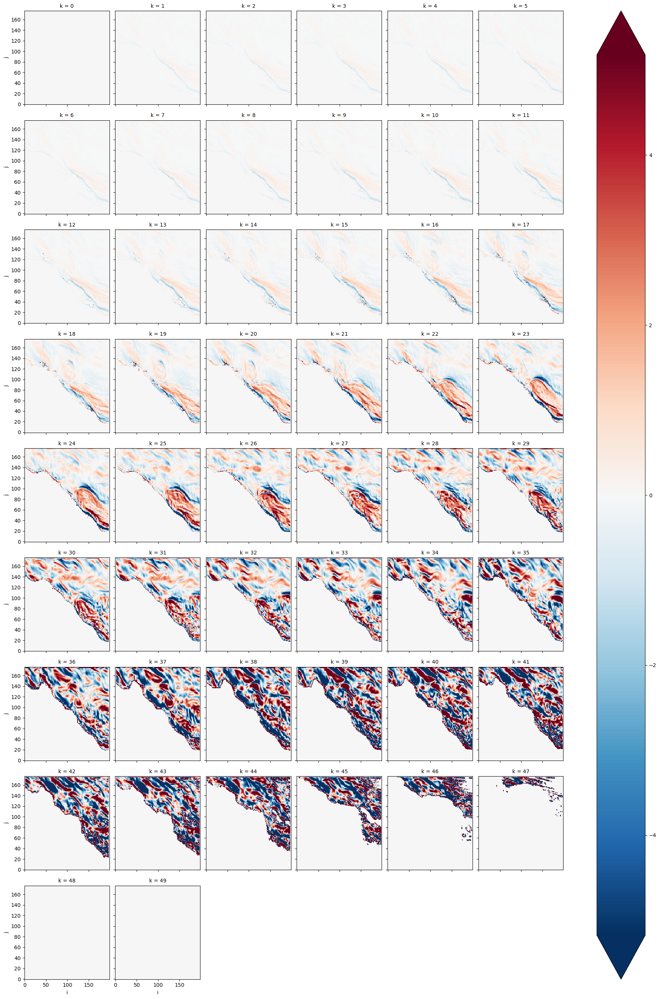

In [60]:
div_flux.plot(x='i',y='j',col='k',col_wrap=6, robust=True)

In [61]:
# (div_flux[1]*div_flux[1].depth_t- div_flux[0]*div_flux[0]
div_flux

<xarray.DataArray (k: 50, j: 177, i: 199)> Size: 7MB
array([[[ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        ...,
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ]],

       [[ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
...
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ]],

       [[ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        ...,
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ]]], shape=(50, 177, 199), dtype=float32)
Coordinates: (12/19)
    time         datetime64[ns] 8B 2021-06-01
  * k            (k) int64 400B 0 1 2 3 4 5 6 7 8 ... 41 42 43 44 45 46 47 48 49
  * j            (j) int64 1kB 0 1 2 3 4 5 6 7 ... 170 171 172 173 174 175 176
  * i            (i) int64 2kB 0 1 2 3 4 5 6 7 ... 192 193 194 195 196 197 198
    longitude_f  (i) float32 796B nan -57.67 -57.58 ... -41.42 -41.33 -41.25
    longitude_u  (i) float32 796B nan -57.67 -57.58 ... -41.42 -41.33 -41.25
    ...           ...
    latitude_v   (j) float32 708B -3.667 -3.583 -3.5 -3.417 ... 10.83 10.92 11.0
    latitude_u   (j) float32 708B -3.625 -3.542 -3.458 ... 10.88 10.96 11.04
    latitude_t   (j) float32 708B -3.625 -3.542 -3.458 ... 10.88 10.96 11.04
    dz_t         (k) float32 200B 0.988 1.107 1.102 1.246 ... 435.3 447.7 458.6
    dx_t         (j) float64 1kB 9.248e+03 9.249e+03 ... 9.097e+03 9.095e+03
    dy_t2        (j) float32 708B 9.266e+03 9.266e+03 ... 9.266e+03 9.266e+03

In [62]:
# 6. Integrate from bottom to top
integrand = -div_flux.isel(k=slice(0, -1)) # we drop the last layer

dz_3d_mid = dz_3d.isel(k=slice(0, -1))
integrand = integrand * dz_3d_mid

# Reverse for bottom-up integration
w_bottom_up = integrand.isel(k=slice(None, None, -1)).cumsum(dim='k', skipna=True)
w_bottom_up = w_bottom_up.isel(k=slice(None, None, -1))  # reverse back

In [63]:
w_bottom_up = w_bottom_up.assign_coords(depth=z_midi)
w_bottom_up.name = 'w_bottom_up'

# Optional: interpolate to center of T cells
# w_FV = ((w_bottom_up + w_bottom_up.shift(depth=-1)) / 2).fillna(0)
# w_FV=w_FV.where(w_FV!=0,np.nan)
# w_FV.name = "w_FV"

In [65]:
## divide by the area
area_3d = dx_3d * dy_3d
area_3d=area_3d.interp(k=w_bottom_up.k)

w_= w_bottom_up / area_3d  # now has units of [m/s]
w_.name = 'w_vertical'
# w =w.where(w!=0,np.nan)

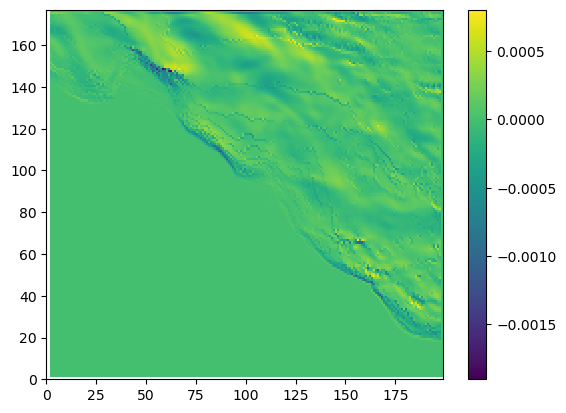

In [66]:
aa=w_bottom_up.data / area_3d.data
# aa[aa != 0] = np.nan

plt.pcolormesh(aa[30,:,:])
plt.colorbar(cmap='jet')

In [67]:
ratio = w_bottom_up / area_3d
print(ratio.min().item(), ratio.max().item(), ratio.mean().item())

-0.0020915951658863102 0.0008068702856128328 5.441026540396843e-07


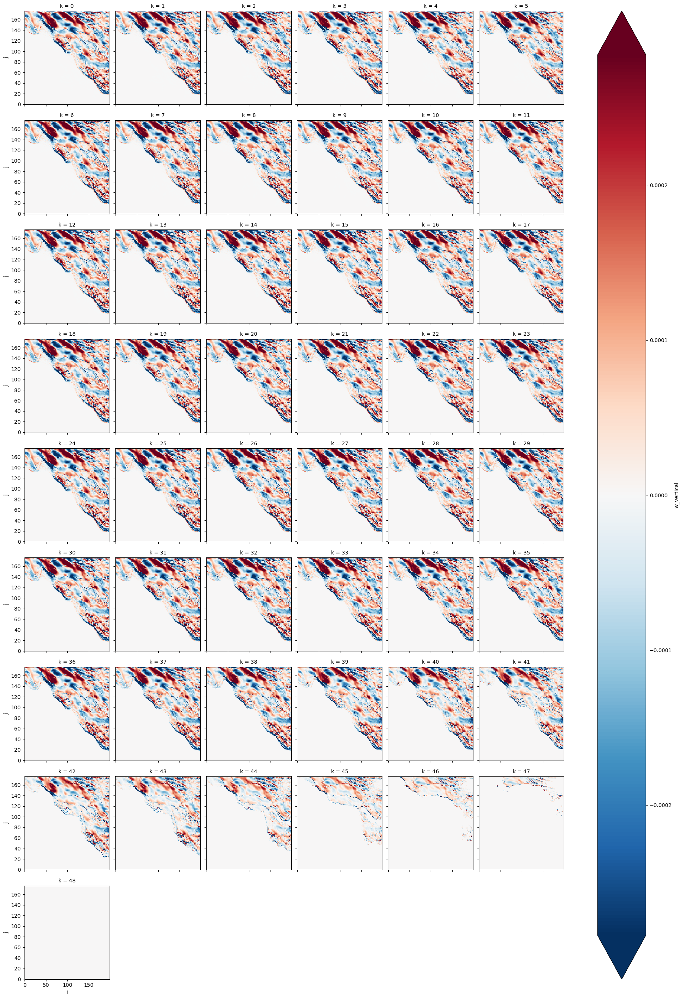

In [68]:
w_.plot(x='i',y='j',col='k',col_wrap=6, robust=True)

### Plotting

In [84]:
lat_min, lat_max = 8, 10
lon_min, lon_max = -49, -47
#--- Mask for W 
mask = (
    ((w.latitude_t>= lat_min) & (w.latitude_t <= lat_max)) &
    ((w.longitude_t >= lon_min) & (w.longitude_t <= lon_max))
)

# Convert boolean to integer (1 inside the box, 0 outside)
binary_mask = mask.astype(int)

mask_3f = xr.broadcast(w.isel(k=0)*0 + 1, binary_mask)[1]
mask_3f = mask_3f.where(mask_3f!=0,np.nan)

## ----- max for U,V in the corners
mask = (
    ((ds.latitude_t >= lat_min) & (ds.latitude_t <= lat_max)) &
    ((ds.longitude_t >= lon_min) & (ds.longitude_t <= lon_max))
)

# Convert boolean to integer (1 inside the box, 0 outside)
bmask = mask.astype(int)

# Broadcast to depth
mask_3c = xr.broadcast(ds.u.isel(k=0)*0 + 1, bmask)[1]


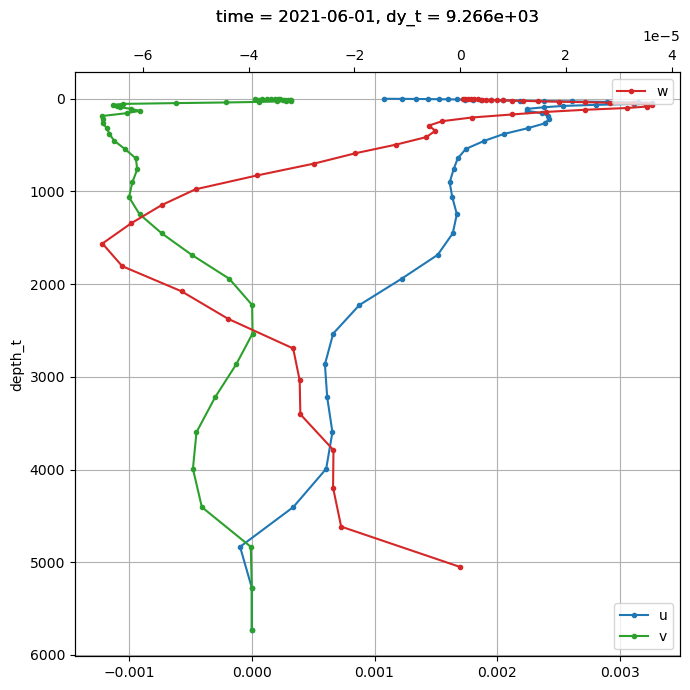

In [89]:
uu = (ds.u * mask_3c).isel(time=0)
vv = (ds.v * mask_3c).isel(time=0)
ww = (w_correct * mask_3f).isel(time=0)


fig, ax = plt.subplots(figsize=(7, 7))

# Eje inferior: u y v
uu.mean(dim=('j', 'i'), skipna=True).plot(
    y='depth_t', marker='.', label='u', ax=ax, color='tab:blue')

vv.mean(dim=('j', 'i'), skipna=True).plot(
    y='depth_t', marker='.', label='v', ax=ax, color='tab:green')

# ax.set_ylim(0, 1500)
ax.invert_yaxis()
ax.grid(visible=True)
ax.legend(loc='lower right')

# Eje superior: w
ax2 = ax.twiny()
ww.mean(dim=('j', 'i'), skipna=True).plot(
    y='depth_w', marker='.', label='w', ax=ax2, color='tab:red')

ax2.legend(loc='upper right')
# ax2.set_xlim(-1e-6,1e-6)

plt.tight_layout()
# plt.grid(True)
plt.show()